In [ ]:
import os
import math
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.ops as ops
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
DEBUG_DATASET   = True
NUM_EPOCHS      = 50
BATCH_SIZE      = 8
IMG_SIZE        = 128
LR              = 3e-4
W_ARMOR         = 1.0
W_OBJ           = 2.0
W_CLS           = 1.0
W_BOX           = 1.0

In [ ]:
# Classes
class_names = ["Motorbike", "Human", "Bus", "Car", "Bicycle", "Pedestrian", "Truck"]
num_classes = len(class_names)

In [ ]:
subsets = {
    "Fog":  "/content/drive/MyDrive/DAWN/Fog",
    "Rain": "/content/drive/MyDrive/DAWN/Rain",
    "Sand": "/content/drive/MyDrive/DAWN/Sand",
    "Snow": "/content/drive/MyDrive/DAWN/Snow",
}

In [ ]:
# ------------------------
class DAWNDataset(Dataset):
    def __init__(self, image_paths, label_dir, transform=None,
                 img_size=128, num_classes=7, debug=False):
        self.image_paths = image_paths
        self.label_dir = label_dir
        self.transform = transform
        self.img_size = img_size
        self.num_classes = num_classes
        self.debug = debug

    def __len__(self):
        # Filter image paths that have corresponding label files
        filtered_image_paths = [
            img_path for img_path in self.image_paths
            if self.has_bounding_boxes(img_path)
        ]
        self.image_paths = filtered_image_paths
        return len(self.image_paths)

    def has_bounding_boxes(self, img_path):
        image_id = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(self.label_dir, image_id + ".txt")
        return os.path.exists(label_path)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image_id = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(self.label_dir, image_id + ".txt")

        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        # target shape = (num_classes + 5, img_size, img_size)
        target = torch.zeros((self.num_classes + 5, self.img_size, self.img_size))

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            for line in lines:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue

                class_idx = int(parts[0])
                # Remap '8' -> '6' if needed
                if class_idx == 8:
                    class_idx = 6  # Suppose '8' means 'Truck'

                if class_idx < 0 or class_idx >= self.num_classes:
                    continue

                x_center = float(parts[1])
                y_center = float(parts[2])
                width    = float(parts[3])
                height   = float(parts[4])

                # Convert normalized values to grid indices
                grid_x = int(x_center * self.img_size)
                grid_y = int(y_center * self.img_size)

                grid_x = min(max(0, grid_x), self.img_size - 1)
                grid_y = min(max(0, grid_y), self.img_size - 1)

                target[class_idx, grid_y, grid_x] = 1.0
                target[self.num_classes,     grid_y, grid_x] = x_center
                target[self.num_classes + 1, grid_y, grid_x] = y_center
                target[self.num_classes + 2, grid_y, grid_x] = width
                target[self.num_classes + 3, grid_y, grid_x] = height
                target[self.num_classes + 4, grid_y, grid_x] = 1.0

        return image, target

In [ ]:
# 4. MODEL DEFINITION (My YOLOv11)
# Define C3K2 Block
class C3K2Block(nn.Module):
    def __init__(self, in_channels, out_channels, n_blocks):
        super(C3K2Block, self).__init__()
        self.initial_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0)
        self.blocks = nn.Sequential(
            *[nn.Sequential(
                nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.SiLU()
            ) for _ in range(n_blocks)]
        )
        self.final_conv = nn.Conv2d(out_channels, out_channels, kernel_size=1, stride=1, padding=0)
        self.residual_conv = (
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0)
            if in_channels != out_channels
            else None
        )
    def forward(self, x):
        residual = self.residual_conv(x) if self.residual_conv else x
        x = self.initial_conv(x)
        x = self.blocks(x)
        return self.final_conv(x + residual)

In [ ]:
# SPFF Module
class SPFFModule(nn.Module):
    def __init__(self, in_channels):
        super(SPFFModule, self).__init__()
        self.pool1 = nn.MaxPool2d(kernel_size=5, stride=1, padding=2)
        self.pool2 = nn.MaxPool2d(kernel_size=9, stride=1, padding=4)
        self.pool3 = nn.MaxPool2d(kernel_size=13, stride=1, padding=6)

    def forward(self, x):
        return torch.cat([x, self.pool1(x), self.pool2(x), self.pool3(x)], dim=1)

In [ ]:
# C2PSA Attention Mechanism
class C2PSABlock(nn.Module):
    def __init__(self, in_channels):
        super(C2PSABlock, self).__init__()
        self.spatial_attention = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // 2, kernel_size=1),
            nn.SiLU(),
            nn.Conv2d(in_channels // 2, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        attention = self.spatial_attention(x)
        return x * attention

In [ ]:
# Backbone
class PowerfulYOLOv11Backbone(nn.Module):
    def __init__(self):
        super(PowerfulYOLOv11Backbone, self).__init__()
        self.stem_conv = nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1)
        self.c3k2_1 = C3K2Block(64, 128, n_blocks=3)
        self.spff_1 = SPFFModule(128)
        self.c2psa_1 = C2PSABlock(128*4)
        self.c3k2_2 = C3K2Block(128*4, 256, n_blocks=3)
        self.down2 = nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1)
        self.c3k2_3 = C3K2Block(256, 256, n_blocks=3)
        self.spff_2 = SPFFModule(256)
        self.c2psa_2 = C2PSABlock(256*4)
        self.c3k2_4 = C3K2Block(256*4, 512, n_blocks=3)
        self.compress_conv = nn.Conv2d(512, 128, kernel_size=1, stride=1, padding=0)
        self.c2psa_extra = C2PSABlock(128)

    def forward(self, x):
        x = F.silu(self.stem_conv(x))
        x = self.c3k2_1(x)
        x = self.spff_1(x)
        x = self.c2psa_1(x)
        x = self.c3k2_2(x)
        x = F.silu(self.down2(x))
        x = self.c3k2_3(x)
        x = self.spff_2(x)
        x = self.c2psa_2(x)
        x = self.c3k2_4(x)
        x = self.compress_conv(x)
        x = self.c2psa_extra(x)
        return x

In [ ]:
# Head
class YOLOv11Head(nn.Module):
    def __init__(self, num_classes=80):
        super(YOLOv11Head, self).__init__()
        self.c2psa = C2PSABlock(128)
        self.upsample = nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False)
        self.final_conv = nn.Conv2d(128, num_classes + 5, kernel_size=1)

    def forward(self, x):
        x = self.c2psa(x)
        x = self.upsample(x)
        return self.final_conv(x)

In [ ]:
# YOLOv11 Model
class YOLOv11(nn.Module):
    def __init__(self, num_classes):
        super(YOLOv11, self).__init__()
        self.backbone = PowerfulYOLOv11Backbone()
        self.head = YOLOv11Head(num_classes)

    def forward(self, x):
        x = self.backbone(x)
        out = self.head(x)
        out_clone = out.clone()
        out_clone[:, num_classes,     :, :] = torch.sigmoid(out[:, num_classes,     :, :])
        out_clone[:, num_classes + 1, :, :] = torch.sigmoid(out[:, num_classes + 1, :, :])
        out_clone[:, num_classes + 2, :, :] = torch.sigmoid(out[:, num_classes + 2, :, :])
        out_clone[:, num_classes + 3, :, :] = torch.sigmoid(out[:, num_classes + 3, :, :])
        return out_clone

In [ ]:
def focal_bce_loss(pred, target, alpha=0.25, gamma=2.0):
    bce = F.binary_cross_entropy_with_logits(pred, target, reduction='none')
    pt = torch.exp(-bce)
    focal_loss = alpha * (1 - pt)**gamma * bce
    return focal_loss

In [ ]:
def bbox_iou(box1, box2, eps=1e-9):
    # box1, box2: [N, 4] in (cx, cy, w, h) format, normalized [0..1].
    b1x1 = box1[:, 0] - box1[:, 2] / 2
    b1x2 = box1[:, 0] + box1[:, 2] / 2
    b1y1 = box1[:, 1] - box1[:, 3] / 2
    b1y2 = box1[:, 1] + box1[:, 3] / 2

    b2x1 = box2[:, 0] - box2[:, 2] / 2
    b2x2 = box2[:, 0] + box2[:, 2] / 2
    b2y1 = box2[:, 1] - box2[:, 3] / 2
    b2y2 = box2[:, 1] + box2[:, 3] / 2

    inter_x1 = torch.max(b1x1, b2x1)
    inter_y1 = torch.max(b1y1, b2y1)
    inter_x2 = torch.min(b1x2, b2x2)
    inter_y2 = torch.min(b1y2, b2y2)
    inter_area = (inter_x2 - inter_x1).clamp(0) * (inter_y2 - inter_y1).clamp(0)

    area1 = (b1x2 - b1x1).clamp(0) * (b1y2 - b1y1).clamp(0)
    area2 = (b2x2 - b2x1).clamp(0) * (b2y2 - b2y1).clamp(0)
    union = area1 + area2 - inter_area + eps
    iou = inter_area / union

    # DIoU / CIoU additional terms
    center_dist = (box1[:, 0] - box2[:, 0])**2 + (box1[:, 1] - box2[:, 1])**2
    enclose_x1 = torch.min(b1x1, b2x1)
    enclose_x2 = torch.max(b1x2, b2x2)
    enclose_y1 = torch.min(b1y1, b2y1)
    enclose_y2 = torch.max(b1y2, b2y2)
    enclose_diag = (enclose_x2 - enclose_x1)**2 + (enclose_y2 - enclose_y1)**2 + eps

    diou = iou - center_dist / enclose_diag

    # For CIoU, also penalize aspect ratio
    v = (4 / math.pi**2) * torch.pow(
        torch.atan(box1[:, 2] / (box1[:, 3] + eps)) -
        torch.atan(box2[:, 2] / (box2[:, 3] + eps)), 2
    )
    with torch.no_grad():
        alpha = v / (1 - iou + v + eps)
    ciou = diou - alpha * v
    return ciou

In [ ]:
def ciou_loss(pred_boxes, tgt_boxes, obj_mask):
    # pred_boxes, tgt_boxes: [B,4,H,W], obj_mask: [B,H,W]
    pred_boxes = pred_boxes.permute(0,2,3,1)[obj_mask==1]
    tgt_boxes  = tgt_boxes.permute(0,2,3,1)[obj_mask==1]
    if pred_boxes.numel() == 0:
        return pred_boxes.sum() * 0.0
    ciou_vals = bbox_iou(pred_boxes, tgt_boxes)
    loss = 1.0 - ciou_vals.mean()
    return loss

In [ ]:
def yolo_loss_ciou(outputs, targets, num_classes=7, w_box=1.0, w_obj=1.0, w_cls=1.0):
    """
    YOLO loss with:
      - Focal BCE for classification
      - BCE for objectness
      - CIoU for bounding boxes
    """
    bce_obj = nn.BCEWithLogitsLoss()

    pred_cls = outputs[:, :num_classes, :, :]
    pred_x   = outputs[:, num_classes, :, :]
    pred_y   = outputs[:, num_classes+1, :, :]
    pred_w   = outputs[:, num_classes+2, :, :]
    pred_h   = outputs[:, num_classes+3, :, :]
    pred_obj_logits = outputs[:, num_classes+4, :, :]

    tgt_cls = targets[:, :num_classes, :, :]
    tgt_x   = targets[:, num_classes, :, :]
    tgt_y   = targets[:, num_classes+1, :, :]
    tgt_w   = targets[:, num_classes+2, :, :]
    tgt_h   = targets[:, num_classes+3, :, :]
    tgt_obj = targets[:, num_classes+4, :, :]

    # Objectness loss
    loss_obj = bce_obj(pred_obj_logits, tgt_obj) * w_obj

    # Classification loss (Focal BCE), only compute where obj=1
    focal_raw = focal_bce_loss(pred_cls, tgt_cls, alpha=0.25, gamma=2.0)
    # Mask out background
    focal_masked = focal_raw * tgt_obj.unsqueeze(1)
    loss_cls = focal_masked.mean() * w_cls

    # CIoU loss
    pred_boxes = torch.stack([pred_x, pred_y, pred_w, pred_h], dim=1)
    tgt_boxes  = torch.stack([tgt_x, tgt_y, tgt_w, tgt_h], dim=1)
    loss_ciou  = ciou_loss(pred_boxes, tgt_boxes, tgt_obj>0) * w_box

    total_loss = loss_obj + loss_cls + loss_ciou
    return total_loss

In [ ]:
!pip install ranger-adabelief

In [ ]:
def train_model(model, train_loader, val_loader,
                num_epochs=50, base_lr=3e-4, num_classes=7):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=base_lr, weight_decay=1e-5)

    # CosineAnnealingWarmRestarts:
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-6
    )

    best_val_loss = float('inf')
    patience = 20
    patience_counter = 0

    for epoch in range(1, num_epochs + 1):
        model.train()
        total_train_loss = 0.0

        for i, (images, targets) in enumerate(train_loader):
            images = images.to(device)
            targets = targets.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = yolo_loss_ciou(outputs, targets, num_classes=num_classes,
                                  w_box=W_BOX, w_obj=W_OBJ, w_cls=W_CLS)
            loss.backward()
            optimizer.step()

            # step scheduler more smoothly
            scheduler.step(epoch - 1 + i / len(train_loader))
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        print(f"[Epoch {epoch}/{num_epochs}] LR: {optimizer.param_groups[0]['lr']:.6f}, Loss: {avg_train_loss:.4f}")

        # Validation
        val_loss = 0.0
        model.eval()
        with torch.no_grad():
            for images_val, targets_val in val_loader:
                images_val = images_val.to(device)
                targets_val = targets_val.to(device)
                outputs_val = model(images_val)
                loss_val = yolo_loss_ciou(outputs_val, targets_val,
                                          num_classes=num_classes,
                                          w_box=W_BOX, w_obj=W_OBJ, w_cls=W_CLS)
                val_loss += loss_val.item()

        val_loss /= len(val_loader)
        print(f"   -> Validation Loss: {val_loss:.4f}")

        # Early stopping logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered!")
                break

    print("Training Complete.")

In [ ]:
def nms(boxes, scores, iou_threshold=0.5):
    # boxes: Nx4 (x1,y1,x2,y2), scores: N
    keep = []
    idxs = scores.argsort(descending=True)
    while len(idxs) > 0:
        current = idxs[0]
        keep.append(current.item())
        if len(idxs) == 1:
            break
        ious = iou_between_boxes(boxes[current], boxes[idxs[1:]])
        idxs = idxs[1:][ious < iou_threshold]
    return keep

def iou_between_boxes(boxA, boxesB):
    # boxA: (4,); boxesB: Nx4
    x1 = torch.max(boxA[0], boxesB[:,0])
    y1 = torch.max(boxA[1], boxesB[:,1])
    x2 = torch.min(boxA[2], boxesB[:,2])
    y2 = torch.min(boxA[3], boxesB[:,3])
    interArea = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)
    areaA = (boxA[2]-boxA[0])*(boxA[3]-boxA[1])
    areaB = (boxesB[:,2]-boxesB[:,0])*(boxesB[:,3]-boxesB[:,1])
    union = areaA + areaB - interArea
    return interArea / (union + 1e-9)

In [ ]:
def test_model(model, test_loader, num_classes=7, obj_threshold=0.3, iou_threshold=0.5):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)
    model.eval()

    total_iou = 0.0
    total_obj = 0.0
    correct_cls = 0
    total_objcls = 0

    with torch.no_grad():
        for images, targets in test_loader:
            images = images.to(device)
            targets = targets.to(device)
            outputs = model(images)

            # Calculate IoU with ground-truth for each object cell
            pred_boxes = outputs[:, num_classes:num_classes+4, :, :]
            true_boxes = targets[:, num_classes:num_classes+4, :, :]
            # [B,4,H,W]
            iou_map = compute_grid_ciou(pred_boxes, true_boxes, targets[:, num_classes+4, :, :]>0)
            total_iou += iou_map.sum().item()
            total_obj += targets[:, num_classes+4, :, :].sum().item()

            # Classification accuracy
            for b_idx in range(images.shape[0]):
                for yy in range(targets.shape[2]):
                    for xx in range(targets.shape[3]):
                        if targets[b_idx, num_classes+4, yy, xx] == 1:
                            gt_cls_idx = torch.argmax(targets[b_idx, :num_classes, yy, xx])
                            pred_cls_idx = torch.argmax(outputs[b_idx, :num_classes, yy, xx])
                            if pred_cls_idx == gt_cls_idx:
                                correct_cls += 1
                            total_objcls += 1

            # Show first image in the batch for demonstration
            for b_idx in range(images.size(0)):
                img_pil = transforms.ToPILImage()(images[b_idx].cpu())
                fig, ax = plt.subplots(1)
                ax.imshow(img_pil)

                # Draw GT in green
                draw_bboxes_from_target(ax, targets[b_idx], num_classes, class_names, color='g')

                # Draw predictions (with NMS) in red
                boxes, scores, cls_inds = collect_predictions(outputs[b_idx], num_classes, obj_threshold)
                # Apply NMS
                if boxes.shape[0] > 0:
                    keep_inds = nms(boxes, scores, iou_threshold=iou_threshold)
                    boxes = boxes[keep_inds]
                    scores = scores[keep_inds]
                    cls_inds = cls_inds[keep_inds]
                # Draw
                for i in range(boxes.shape[0]):
                    x1, y1, x2, y2 = boxes[i].tolist()
                    cls_idx = int(cls_inds[i].item())
                    class_name = class_names[cls_idx]
                    rect = patches.Rectangle((x1,y1), x2 - x1, y2 - y1,
                                            linewidth=2, edgecolor='r', facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x1, y1, f"{class_name} {scores[i]:.2f}", color='r', fontsize=9,
                            bbox=dict(facecolor='w', alpha=0.6))
                plt.show()

    mean_iou = total_iou / (total_obj + 1e-6)
    accuracy = correct_cls / total_objcls if total_objcls > 0 else 0.0
    print(f"Mean IoU over test set: {mean_iou:.4f}")
    print(f"Classification Accuracy (object cells): {accuracy:.4f}")
    print("\n" + "-"*50)

In [ ]:
# Helper to compute grid-level IoU
def compute_grid_ciou(pred_boxes, tgt_boxes, mask):
    # Returns [B, H, W] of IoU where mask=1
    B, _, H, W = pred_boxes.shape
    iou_map = torch.zeros((B, H, W), device=pred_boxes.device)
    for b in range(B):
        pb = pred_boxes[b].reshape(4, -1).permute(1,0)
        tb = tgt_boxes[b].reshape(4, -1).permute(1,0)
        m  = mask[b].flatten()
        if m.sum() > 0:
            ious = bbox_iou(pb[m==1], tb[m==1])
            i = 0
            idxs = (m==1).nonzero(as_tuple=True)[0]
            for idx in idxs:
                iou_map[b, idx//W, idx%W] = ious[i]
                i += 1
    return iou_map

In [ ]:
# Helper to visualize GT bboxes
def draw_bboxes_from_target(ax, target_tensor, num_cls, class_list, color='g'):
    h, w = target_tensor.shape[-2], target_tensor.shape[-1]
    obj_mask = target_tensor[num_cls+4]
    for yy in range(h):
        for xx in range(w):
            if obj_mask[yy, xx] == 1:
                cls_idx = torch.argmax(target_tensor[:num_cls, yy, xx])
                class_idx = min(max(0, cls_idx), num_cls-1)
                class_name = class_list[class_idx]
                cx = target_tensor[num_cls, yy, xx].item()
                cy = target_tensor[num_cls+1, yy, xx].item()
                bw = target_tensor[num_cls+2, yy, xx].item()
                bh = target_tensor[num_cls+3, yy, xx].item()
                x1 = (cx - bw/2) * IMG_SIZE
                y1 = (cy - bh/2) * IMG_SIZE
                x2 = (cx + bw/2) * IMG_SIZE
                y2 = (cy + bh/2) * IMG_SIZE
                rect = patches.Rectangle((x1,y1), x2 - x1, y2 - y1,
                                        linewidth=2, edgecolor=color, facecolor='none')
                ax.add_patch(rect)
                ax.text(x1, y1, class_name, color=color, fontsize=8,
                        bbox=dict(facecolor='w', alpha=0.6))

In [ ]:
# Helper to collect predictions (before NMS)
def collect_predictions(output, num_cls, obj_thresh):
    # output: shape (num_cls+5, H, W)
    # Convert to list of boxes with conf above threshold
    out_obj_conf = torch.sigmoid(output[num_cls+4])
    H, W = out_obj_conf.shape
    boxes = []
    scores = []
    cls_inds = []

    for yy in range(H):
        for xx in range(W):
            conf = out_obj_conf[yy, xx].item()
            if conf > obj_thresh:
                # Classification
                class_probs = torch.sigmoid(output[:num_cls, yy, xx])
                pred_cls_idx = torch.argmax(class_probs).item()
                cls_conf = class_probs[pred_cls_idx].item()

                # Box
                bx = output[num_cls, yy, xx].item()
                by = output[num_cls+1, yy, xx].item()
                bw = output[num_cls+2, yy, xx].item()
                bh = output[num_cls+3, yy, xx].item()

                # Convert to x1,y1,x2,y2 (in image coords)
                x1 = (bx - bw/2) * IMG_SIZE
                y1 = (by - bh/2) * IMG_SIZE
                x2 = (bx + bw/2) * IMG_SIZE
                y2 = (by + bh/2) * IMG_SIZE

                boxes.append([x1, y1, x2, y2])
                scores.append(conf * cls_conf)
                cls_inds.append(pred_cls_idx)

    if len(boxes) == 0:
        return torch.zeros((0,4)), torch.zeros(0), torch.zeros(0)
    boxes = torch.tensor(boxes)
    scores = torch.tensor(scores)
    cls_inds = torch.tensor(cls_inds)
    return boxes, scores, cls_inds

In [ ]:
transform_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.3),
    transforms.RandomRotation(degrees=(-5,5)),
    transforms.ToTensor(),
])

transform_val_test = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

train_loaders = {}
val_loaders   = {}
test_loaders  = {}

for subset, base_dir in subsets.items():
    print(f"\nPreparing subset '{subset}' at {base_dir}")
    label_dir = os.path.join(base_dir, f"{subset}_YOLO_darknet")

    all_images = [f for f in os.listdir(base_dir) if f.lower().endswith(".jpg")]
    image_paths = [os.path.join(base_dir, f) for f in all_images]
    print(f"Found {len(image_paths)} images for {subset}")

    if len(image_paths) == 0:
        print(f"[WARNING] No .jpg images found in {base_dir}, skipping {subset}.")
        continue

    random.shuffle(image_paths)
    train_split = int(0.7 * len(image_paths))
    val_split   = int(0.9 * len(image_paths))

    train_images = image_paths[:train_split]
    val_images   = image_paths[train_split:val_split]
    test_images  = image_paths[val_split:]

    train_dataset = DAWNDataset(
        train_images, label_dir,
        transform=transform_train, img_size=IMG_SIZE,
        num_classes=num_classes, debug=DEBUG_DATASET
    )
    val_dataset = DAWNDataset(
        val_images, label_dir,
        transform=transform_val_test, img_size=IMG_SIZE,
        num_classes=num_classes, debug=False
    )
    test_dataset = DAWNDataset(
        test_images, label_dir,
        transform=transform_val_test, img_size=IMG_SIZE,
        num_classes=num_classes, debug=False
    )

    print(f"  -> Train: {len(train_dataset)}, Val: {len(val_dataset)}, Test: {len(test_dataset)}")

    if len(train_dataset) > 0:
        train_loaders[subset] = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    if len(val_dataset) > 0:
        val_loaders[subset] = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    if len(test_dataset) > 0:
        test_loaders[subset] = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

    print(f"{subset} -> Train: {len(train_dataset)}, Val: {len(val_dataset)}, Test: {len(test_dataset)}")


Preparing subset 'Fog' at /content/drive/MyDrive/DAWN/Fog
Found 300 images for Fog
  -> Train: 210, Val: 60, Test: 30
Fog -> Train: 210, Val: 60, Test: 30

Preparing subset 'Rain' at /content/drive/MyDrive/DAWN/Rain
Found 200 images for Rain
  -> Train: 140, Val: 40, Test: 20
Rain -> Train: 140, Val: 40, Test: 20

Preparing subset 'Sand' at /content/drive/MyDrive/DAWN/Sand
Found 323 images for Sand
  -> Train: 226, Val: 64, Test: 33
Sand -> Train: 226, Val: 64, Test: 33

Preparing subset 'Snow' at /content/drive/MyDrive/DAWN/Snow
Found 204 images for Snow
  -> Train: 142, Val: 41, Test: 21
Snow -> Train: 142, Val: 41, Test: 21


In [ ]:
!pip install ultralytics

In [ ]:
model = YOLOv11(num_classes=num_classes)

pretrained_path = "/content/drive/MyDrive/DAWN/yolo11x.pt"  # adjust if you have a checkpoint
if os.path.exists(pretrained_path):
    print("Loading YOLOv11 pretrained model from:", pretrained_path)
    checkpoint = torch.load(pretrained_path, map_location="cpu")
    if isinstance(checkpoint, dict) and "model_state_dict" in checkpoint:
        model.load_state_dict(checkpoint["model_state_dict"], strict=False)
    else:
        model.load_state_dict(checkpoint, strict=False)
else:
    print("[WARNING] No YOLOv11 pretrained checkpoint found. Training from scratch.")

Loading YOLOv11 pretrained model from: /content/drive/MyDrive/DAWN/yolo11x.pt


<ipython-input-26-198b0d78d89d>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(pretrained_path, map_location="cpu")



===== Training on Fog =====
[Epoch 1/50] LR: 0.000293, Loss: 1.2133
   -> Validation Loss: 1.0525
[Epoch 2/50] LR: 0.000272, Loss: 0.9700
   -> Validation Loss: 0.9224
[Epoch 3/50] LR: 0.000240, Loss: 0.9097
   -> Validation Loss: 0.8677
[Epoch 4/50] LR: 0.000198, Loss: 0.8551
   -> Validation Loss: 0.8366
[Epoch 5/50] LR: 0.000152, Loss: 0.8560
   -> Validation Loss: 0.7689
[Epoch 6/50] LR: 0.000106, Loss: 0.7846
   -> Validation Loss: 0.7973
[Epoch 7/50] LR: 0.000064, Loss: 0.7424
   -> Validation Loss: 0.7228
[Epoch 8/50] LR: 0.000031, Loss: 0.7311
   -> Validation Loss: 0.6851
[Epoch 9/50] LR: 0.000009, Loss: 0.6739
   -> Validation Loss: 0.6629
[Epoch 10/50] LR: 0.000001, Loss: 0.6563
   -> Validation Loss: 0.6574
[Epoch 11/50] LR: 0.000298, Loss: 0.8185
   -> Validation Loss: 0.8106
[Epoch 12/50] LR: 0.000293, Loss: 0.7836
   -> Validation Loss: 0.8625
[Epoch 13/50] LR: 0.000284, Loss: 0.8457
   -> Validation Loss: 0.8080
[Epoch 14/50] LR: 0.000272, Loss: 0.7522
   -> Validation

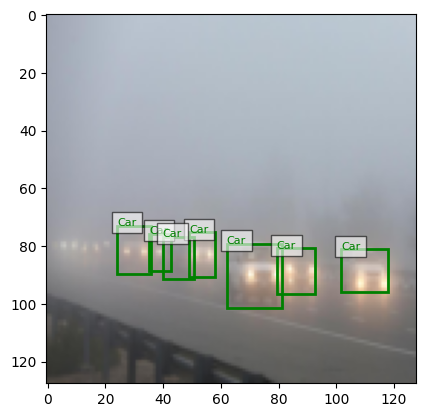

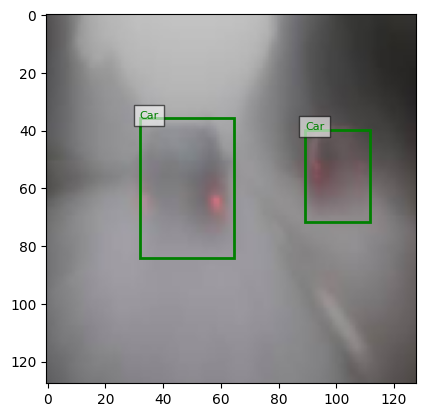

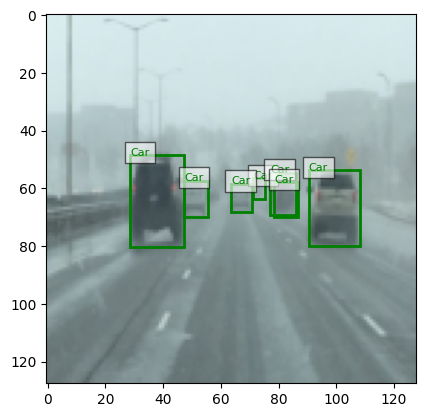

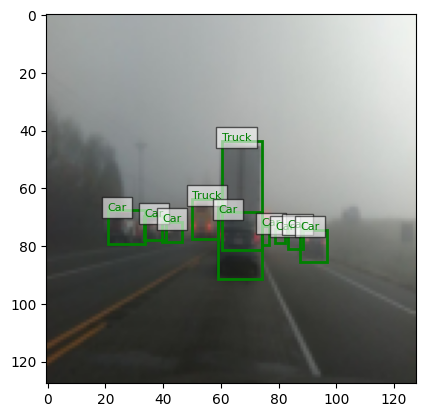

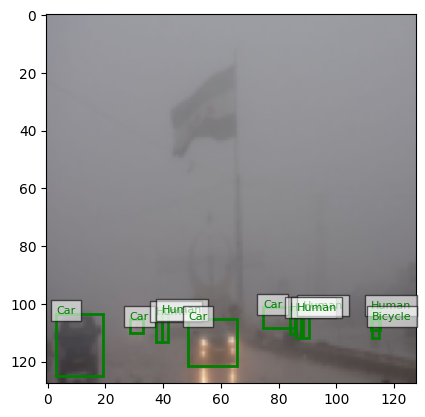

...

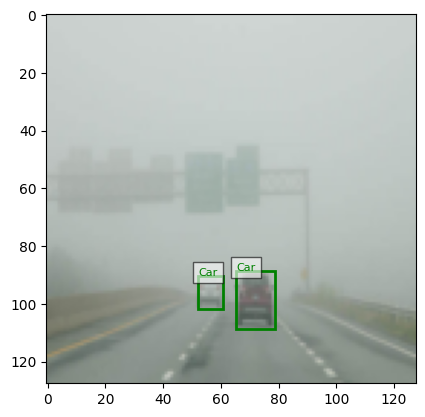

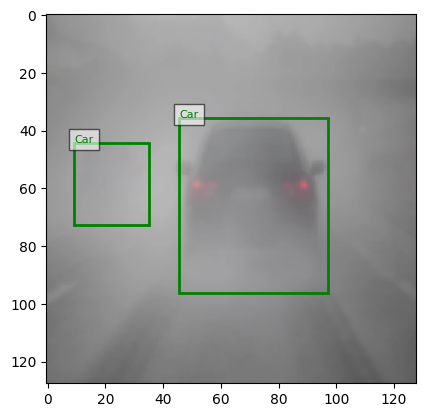

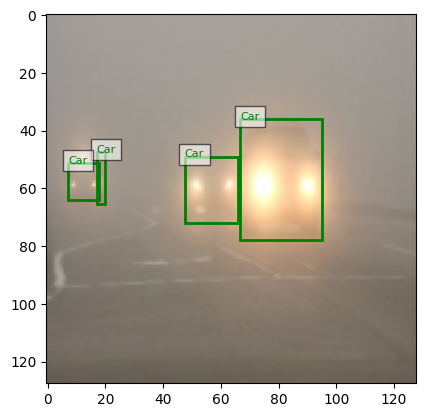

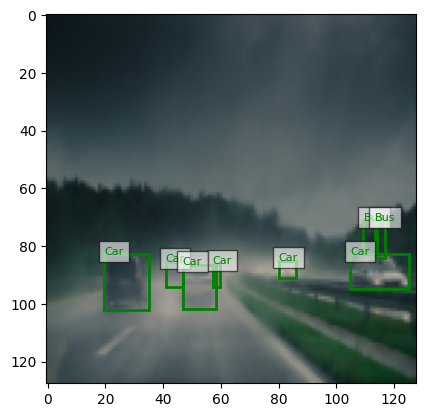

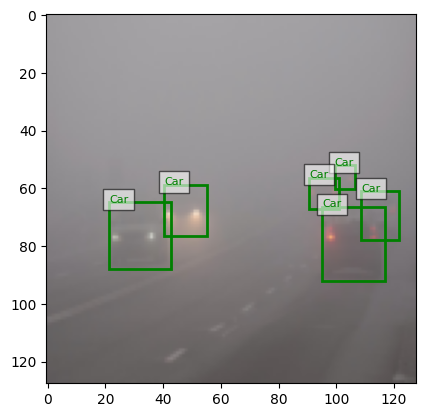

Mean IoU over test set: 0.3502
Classification Accuracy (object cells): 0.7515

--------------------------------------------------

===== Training on Rain =====
[Epoch 1/50] LR: 0.000293, Loss: 0.7975
   -> Validation Loss: 0.8129
[Epoch 2/50] LR: 0.000273, Loss: 0.7063
   -> Validation Loss: 0.7186
[Epoch 3/50] LR: 0.000240, Loss: 0.7391
   -> Validation Loss: 0.7663
[Epoch 4/50] LR: 0.000199, Loss: 0.7021
   -> Validation Loss: 0.6801
[Epoch 5/50] LR: 0.000153, Loss: 0.6615
   -> Validation Loss: 0.6342
[Epoch 6/50] LR: 0.000107, Loss: 0.6475
   -> Validation Loss: 0.6458
[Epoch 7/50] LR: 0.000065, Loss: 0.6365
   -> Validation Loss: 0.6159
[Epoch 8/50] LR: 0.000031, Loss: 0.6299
   -> Validation Loss: 0.6089
[Epoch 9/50] LR: 0.000009, Loss: 0.6163
   -> Validation Loss: 0.6106
[Epoch 10/50] LR: 0.000001, Loss: 0.6128
   -> Validation Loss: 0.6073
[Epoch 11/50] LR: 0.000298, Loss: 0.6651
   -> Validation Loss: 0.8374
[Epoch 12/50] LR: 0.000293, Loss: 0.7558
   -> Validation Loss: 0.75

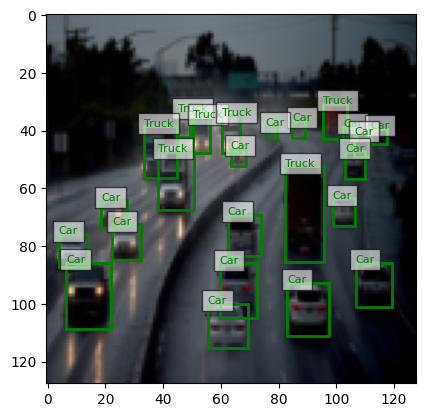

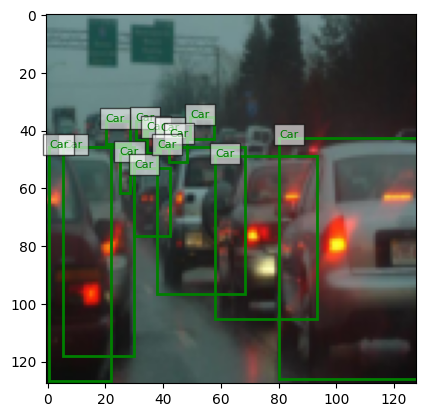

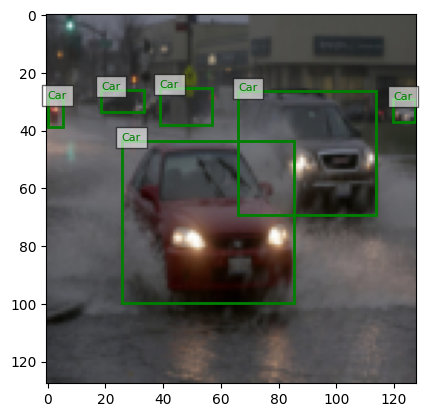

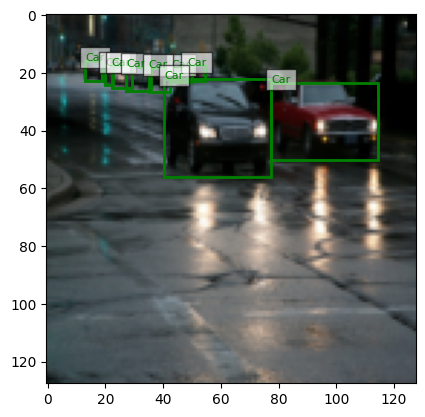

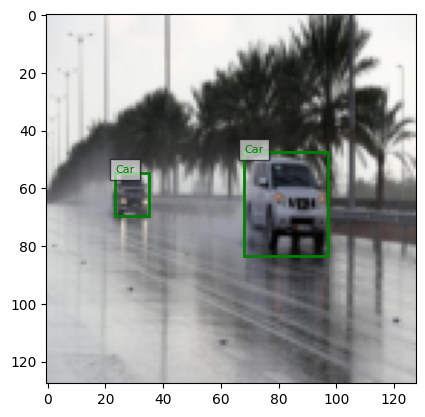

...

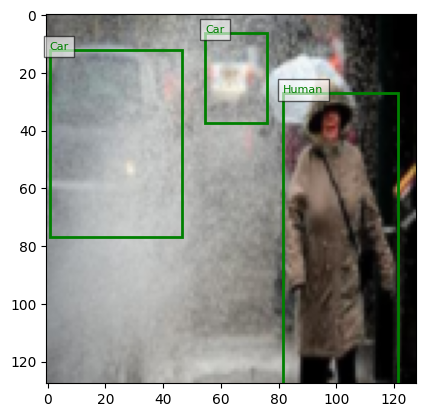

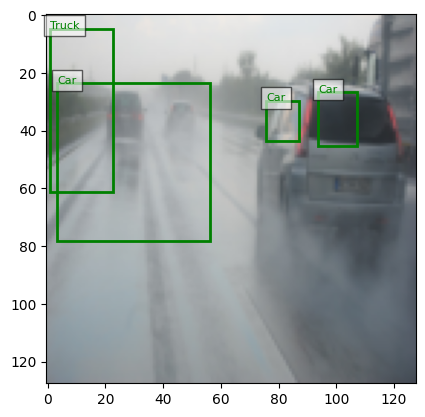

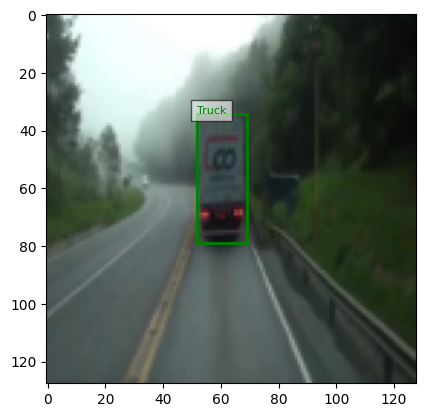

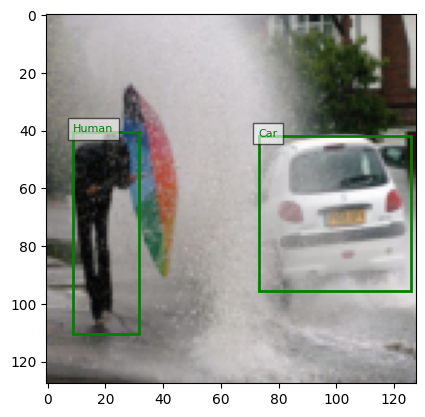

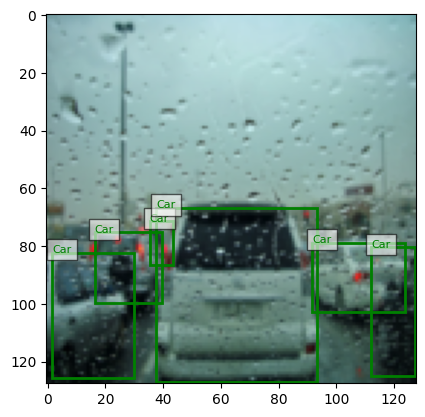

Mean IoU over test set: 0.3388
Classification Accuracy (object cells): 0.8819

--------------------------------------------------

===== Training on Sand =====
[Epoch 1/50] LR: 0.000293, Loss: 0.7626
   -> Validation Loss: 0.7822
[Epoch 2/50] LR: 0.000272, Loss: 0.7042
   -> Validation Loss: 0.7490
[Epoch 3/50] LR: 0.000240, Loss: 0.6861
   -> Validation Loss: 0.6814
[Epoch 4/50] LR: 0.000198, Loss: 0.6777
   -> Validation Loss: 0.7011
[Epoch 5/50] LR: 0.000152, Loss: 0.6666
   -> Validation Loss: 0.6758
[Epoch 6/50] LR: 0.000106, Loss: 0.6610
   -> Validation Loss: 0.6712
[Epoch 7/50] LR: 0.000064, Loss: 0.6466
   -> Validation Loss: 0.6550
[Epoch 8/50] LR: 0.000031, Loss: 0.6348
   -> Validation Loss: 0.6290
[Epoch 9/50] LR: 0.000009, Loss: 0.6382
   -> Validation Loss: 0.6290
[Epoch 10/50] LR: 0.000001, Loss: 0.6174
   -> Validation Loss: 0.6232
[Epoch 11/50] LR: 0.000298, Loss: 0.6770
   -> Validation Loss: 0.7174
[Epoch 12/50] LR: 0.000293, Loss: 0.6972
   -> Validation Loss: 0.69

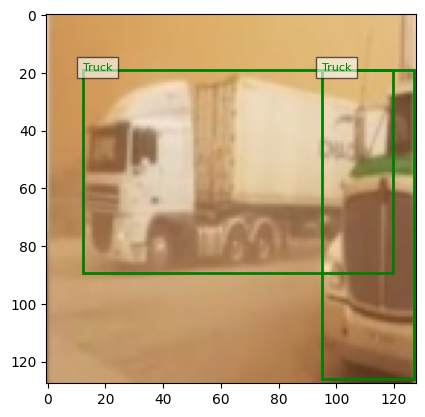

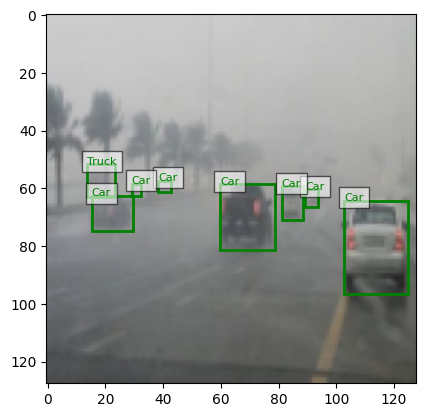

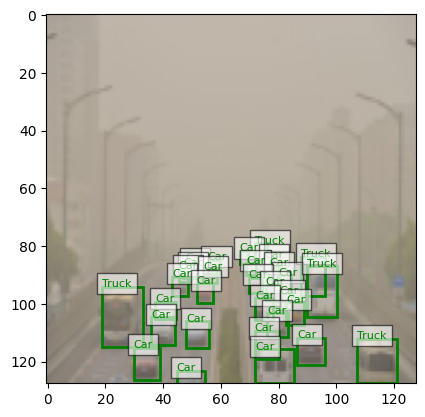

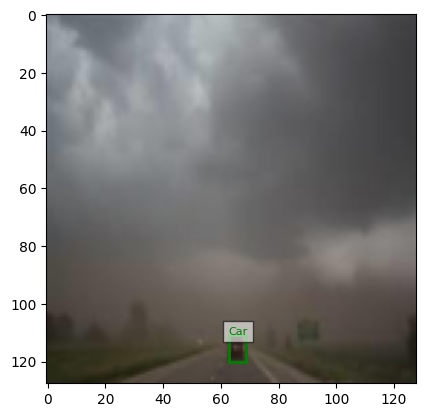

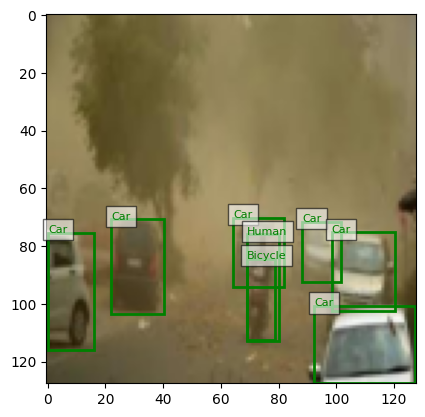

...

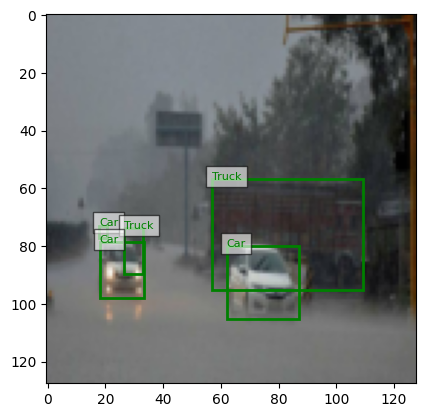

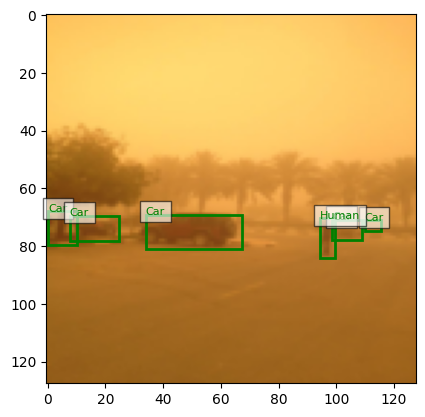

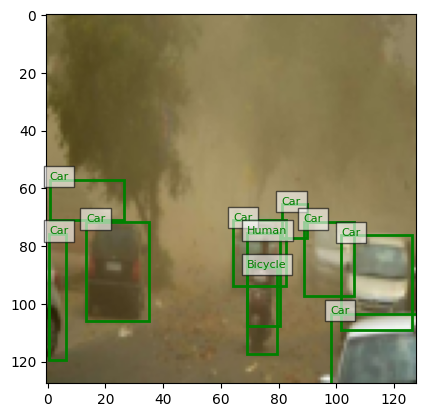

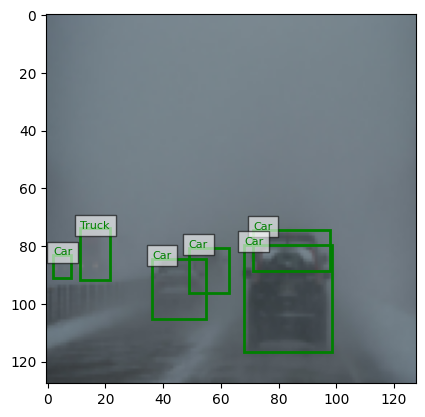

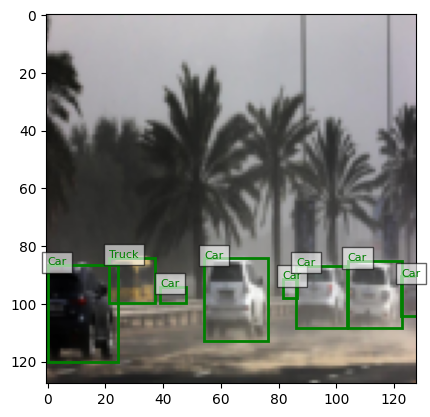

Mean IoU over test set: 0.3868
Classification Accuracy (object cells): 0.8315

--------------------------------------------------

===== Training on Snow =====
[Epoch 1/50] LR: 0.000293, Loss: 0.7065
   -> Validation Loss: 0.7079
[Epoch 2/50] LR: 0.000273, Loss: 0.6428
   -> Validation Loss: 0.6746
[Epoch 3/50] LR: 0.000240, Loss: 0.6225
   -> Validation Loss: 0.6548
[Epoch 4/50] LR: 0.000199, Loss: 0.6125
   -> Validation Loss: 0.6487
[Epoch 5/50] LR: 0.000153, Loss: 0.5826
   -> Validation Loss: 0.6174
[Epoch 6/50] LR: 0.000107, Loss: 0.5714
   -> Validation Loss: 0.6165
[Epoch 7/50] LR: 0.000065, Loss: 0.5765
   -> Validation Loss: 0.5993
[Epoch 8/50] LR: 0.000031, Loss: 0.5589
   -> Validation Loss: 0.5834
[Epoch 9/50] LR: 0.000009, Loss: 0.5480
   -> Validation Loss: 0.5814
[Epoch 10/50] LR: 0.000001, Loss: 0.5422
   -> Validation Loss: 0.5791
[Epoch 11/50] LR: 0.000298, Loss: 0.6159
   -> Validation Loss: 0.6702
[Epoch 12/50] LR: 0.000293, Loss: 0.6139
   -> Validation Loss: 0.63

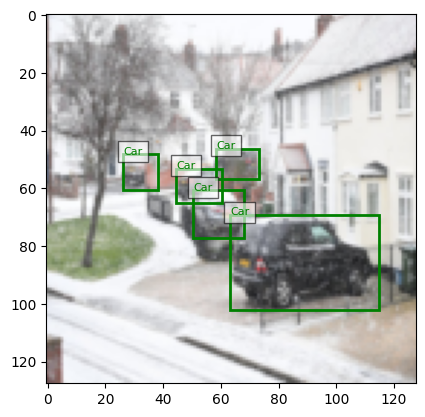

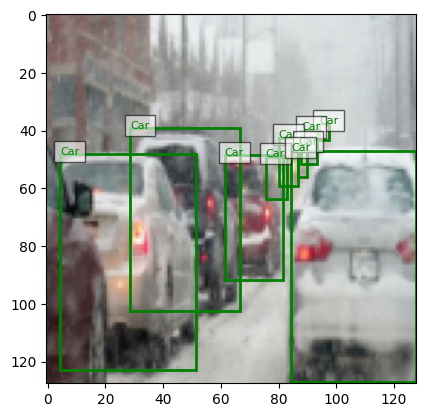

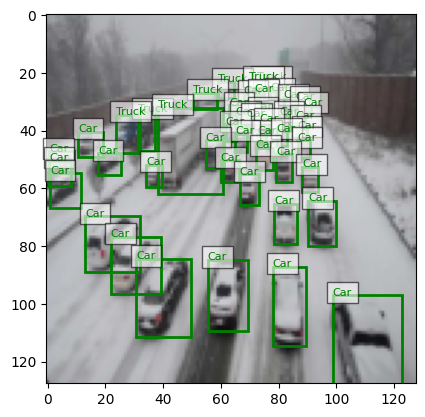

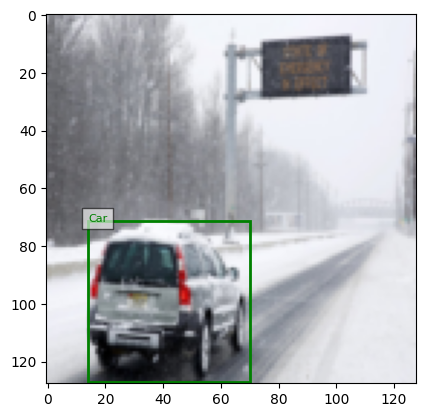

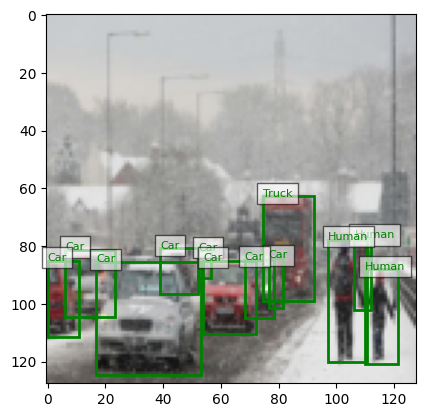

...

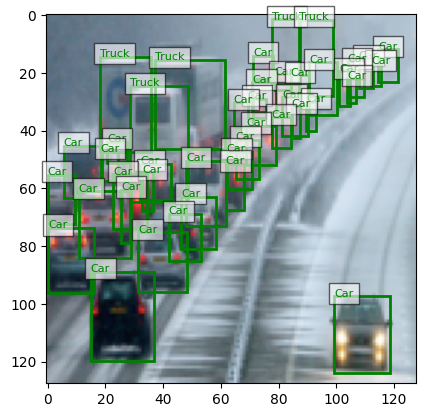

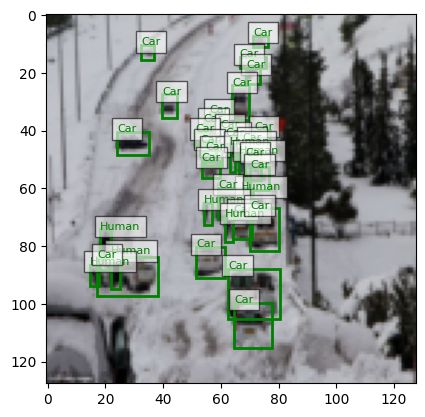

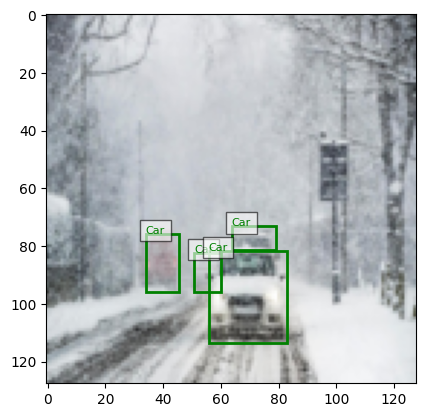

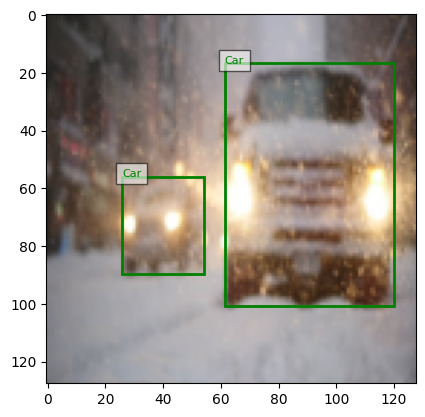

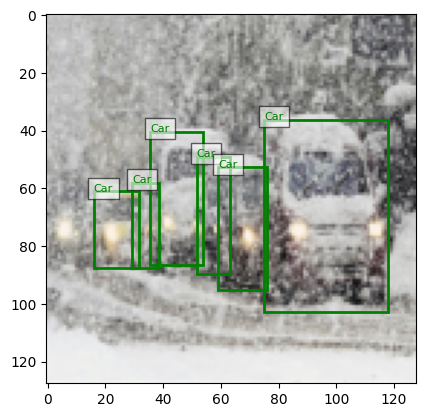

Mean IoU over test set: 0.4517
Classification Accuracy (object cells): 0.8627

--------------------------------------------------


In [ ]:
for subset in subsets.keys():
    if subset not in train_loaders or subset not in val_loaders or subset not in test_loaders:
        print(f"\nSkipping '{subset}' (missing data).")
        continue

    print(f"\n===== Training on {subset} =====")
    train_model(model,
                train_loader=train_loaders[subset],
                val_loader=val_loaders[subset],
                num_epochs=NUM_EPOCHS,
                base_lr=LR,
                num_classes=num_classes)

    print(f"===== Testing on {subset} =====")
    test_model(model, test_loaders[subset], num_classes=num_classes, obj_threshold=0.3, iou_threshold=0.5)

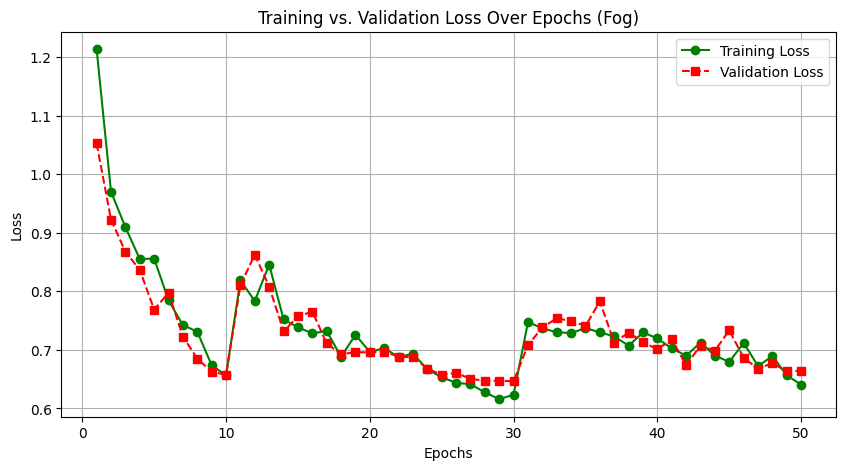

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

epochs = np.arange(1, 51)
train_loss = [
    1.2133, 0.9700, 0.9097, 0.8551, 0.8560, 0.7846, 0.7424, 0.7311, 0.6739, 0.6563,
    0.8185, 0.7836, 0.8457, 0.7522, 0.7385, 0.7284, 0.7321, 0.6883, 0.7256, 0.6966,
    0.7030, 0.6877, 0.6937, 0.6667, 0.6534, 0.6438, 0.6414, 0.6276, 0.6158, 0.6237,
    0.7476, 0.7369, 0.7301, 0.7287, 0.7373, 0.7299, 0.7231, 0.7072, 0.7299, 0.7196,
    0.7025, 0.6901, 0.7126, 0.6901, 0.6796, 0.7118, 0.6725, 0.6894, 0.6565, 0.6407
]

val_loss = [
    1.0525, 0.9224, 0.8677, 0.8366, 0.7689, 0.7973, 0.7228, 0.6851, 0.6629, 0.6574,
    0.8106, 0.8625, 0.8080, 0.7318, 0.7571, 0.7655, 0.7112, 0.6928, 0.6959, 0.6959,
    0.6971, 0.6887, 0.6874, 0.6682, 0.6573, 0.6608, 0.6505, 0.6475, 0.6473, 0.6464,
    0.7082, 0.7383, 0.7539, 0.7493, 0.7408, 0.7828, 0.7124, 0.7297, 0.7134, 0.7010,
    0.7180, 0.6739, 0.7074, 0.6987, 0.7334, 0.6864, 0.6681, 0.6772, 0.6634, 0.6645
]

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, label="Training Loss", marker='o', linestyle="-", color="green")
plt.plot(epochs, val_loss, label="Validation Loss", marker='s', linestyle="--", color="red")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss Over Epochs (Fog)")
plt.legend()
plt.grid(True)
plt.show()

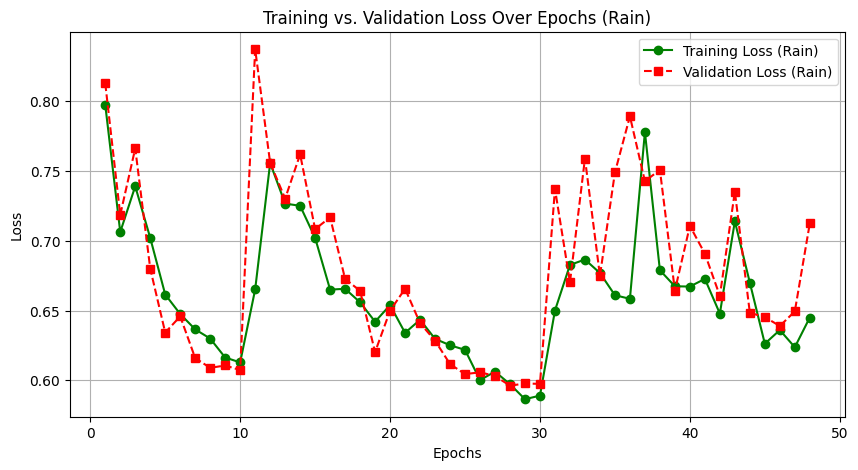

In [ ]:
epochs = np.arange(1, 49)
train_loss_rain = [
    0.7975, 0.7063, 0.7391, 0.7021, 0.6615, 0.6475, 0.6365, 0.6299, 0.6163, 0.6128,
    0.6651, 0.7558, 0.7267, 0.7251, 0.7021, 0.6650, 0.6656, 0.6559, 0.6420, 0.6539,
    0.6340, 0.6434, 0.6297, 0.6251, 0.6218, 0.6001, 0.6062, 0.5972, 0.5864, 0.5890,
    0.6500, 0.6827, 0.6866, 0.6769, 0.6610, 0.6584, 0.7780, 0.6789, 0.6674, 0.6672,
    0.6727, 0.6478, 0.7140, 0.6700, 0.6262, 0.6360, 0.6237, 0.6450
]

val_loss_rain = [
    0.8129, 0.7186, 0.7663, 0.6801, 0.6342, 0.6458, 0.6159, 0.6089, 0.6106, 0.6073,
    0.8374, 0.7559, 0.7303, 0.7620, 0.7084, 0.7168, 0.6727, 0.6641, 0.6202, 0.6499,
    0.6656, 0.6410, 0.6284, 0.6116, 0.6044, 0.6057, 0.6031, 0.5961, 0.5977, 0.5974,
    0.7372, 0.6703, 0.7590, 0.6750, 0.7490, 0.7893, 0.7427, 0.7509, 0.6643, 0.7107,
    0.6908, 0.6605, 0.7353, 0.6484, 0.6453, 0.6389, 0.6494, 0.7125
]

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss_rain, label="Training Loss (Rain)", marker='o', linestyle="-", color="green")
plt.plot(epochs, val_loss_rain, label="Validation Loss (Rain)", marker='s', linestyle="--", color="red")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss Over Epochs (Rain)")
plt.legend()
plt.grid(True)
plt.show()

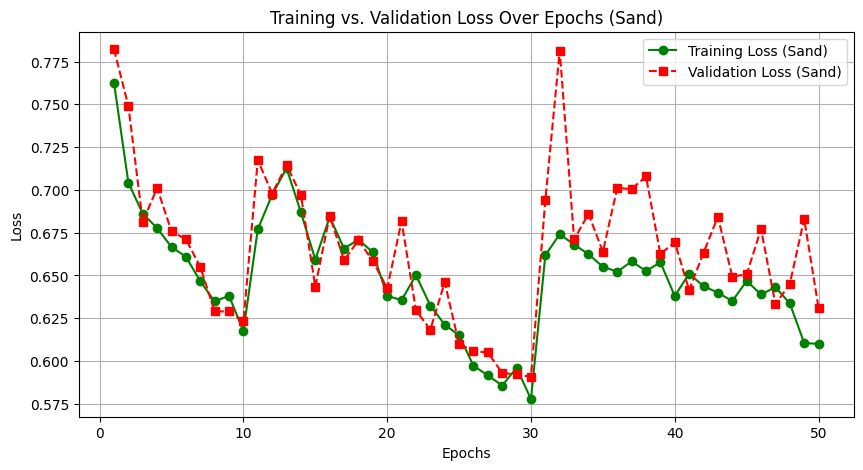

In [ ]:
epochs = np.arange(1, 51)
train_loss_sand = [
    0.7626, 0.7042, 0.6861, 0.6777, 0.6666, 0.6610, 0.6466, 0.6348, 0.6382, 0.6174,
    0.6770, 0.6972, 0.7127, 0.6869, 0.6592, 0.6842, 0.6657, 0.6710, 0.6635, 0.6381,
    0.6356, 0.6502, 0.6324, 0.6213, 0.6150, 0.5973, 0.5916, 0.5857, 0.5961, 0.5777,
    0.6619, 0.6741, 0.6681, 0.6624, 0.6551, 0.6522, 0.6582, 0.6526, 0.6577, 0.6380,
    0.6511, 0.6437, 0.6400, 0.6350, 0.6468, 0.6389, 0.6432, 0.6337, 0.6106, 0.6100
]

val_loss_sand = [
    0.7822, 0.7490, 0.6814, 0.7011, 0.6758, 0.6712, 0.6550, 0.6290, 0.6290, 0.6232,
    0.7174, 0.6979, 0.7145, 0.6970, 0.6435, 0.6850, 0.6589, 0.6706, 0.6585, 0.6425,
    0.6817, 0.6297, 0.6183, 0.6460, 0.6100, 0.6058, 0.6050, 0.5930, 0.5922, 0.5907,
    0.6941, 0.7814, 0.6711, 0.6860, 0.6639, 0.7011, 0.7005, 0.7079, 0.6625, 0.6695,
    0.6414, 0.6633, 0.6843, 0.6493, 0.6507, 0.6771, 0.6333, 0.6450, 0.6832, 0.6310
]

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss_sand, label="Training Loss (Sand)", marker='o', linestyle="-", color="green")
plt.plot(epochs, val_loss_sand, label="Validation Loss (Sand)", marker='s', linestyle="--", color="red")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss Over Epochs (Sand)")
plt.legend()
plt.grid(True)
plt.show()

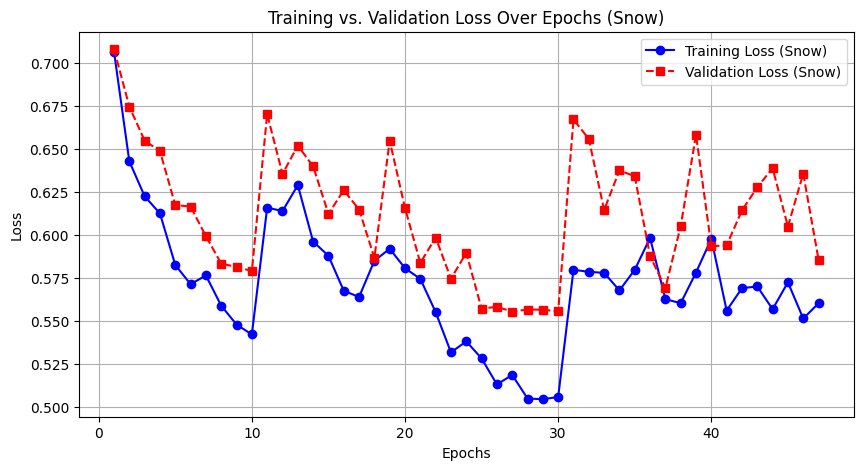

In [ ]:
epochs = np.arange(1, 48)
train_loss_snow = [
    0.7065, 0.6428, 0.6225, 0.6125, 0.5826, 0.5714, 0.5765, 0.5589, 0.5480, 0.5422,
    0.6159, 0.6139, 0.6289, 0.5962, 0.5879, 0.5676, 0.5640, 0.5850, 0.5920, 0.5807,
    0.5745, 0.5552, 0.5318, 0.5382, 0.5283, 0.5132, 0.5187, 0.5050, 0.5046, 0.5059,
    0.5798, 0.5786, 0.5780, 0.5678, 0.5798, 0.5983, 0.5627, 0.5604, 0.5782, 0.5978,
    0.5561, 0.5691, 0.5701, 0.5569, 0.5725, 0.5515, 0.5603
]

val_loss_snow = [
    0.7079, 0.6746, 0.6548, 0.6487, 0.6174, 0.6165, 0.5993, 0.5834, 0.5814, 0.5791,
    0.6702, 0.6354, 0.6519, 0.6399, 0.6123, 0.6260, 0.6148, 0.5867, 0.6548, 0.6156,
    0.5838, 0.5985, 0.5746, 0.5896, 0.5572, 0.5583, 0.5555, 0.5567, 0.5566, 0.5556,
    0.6671, 0.6558, 0.6145, 0.6375, 0.6341, 0.5878, 0.5691, 0.6052, 0.6582, 0.5934,
    0.5940, 0.6143, 0.6277, 0.6388, 0.6049, 0.6357, 0.5857
]

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss_snow, label="Training Loss (Snow)", marker='o', linestyle="-", color="blue")
plt.plot(epochs, val_loss_snow, label="Validation Loss (Snow)", marker='s', linestyle="--", color="red")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss Over Epochs (Snow)")
plt.legend()
plt.grid(True)
plt.show()

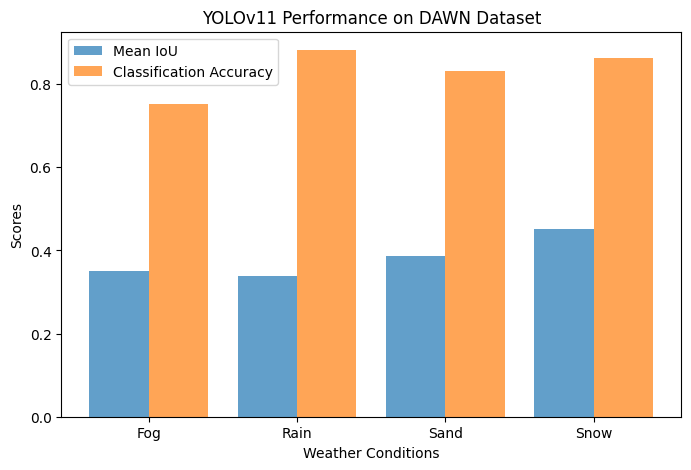

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

weather_conditions = ["Fog", "Rain", "Sand", "Snow"]
mean_iou = [0.3502, 0.3388, 0.3868, 0.4517]
classification_accuracy = [0.7515, 0.8819, 0.8315, 0.8627]
x = np.arange(len(weather_conditions))
plt.figure(figsize=(8, 5))
plt.bar(x - 0.2, mean_iou, width=0.4, label="Mean IoU", alpha=0.7)
plt.bar(x + 0.2, classification_accuracy, width=0.4, label="Classification Accuracy", alpha=0.7)
plt.xticks(x, weather_conditions)
plt.ylabel("Scores")
plt.xlabel("Weather Conditions")
plt.title("YOLOv11 Performance on DAWN Dataset")
plt.legend()
plt.show()